<a href="https://colab.research.google.com/github/SaraSAli/License-Plate-Recognition/blob/main/lane_detectoin.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Applied K means algorithm to image 1

In [40]:
import cv2 
import numpy as np 
from google.colab.patches import cv2_imshow

In [9]:
def convert_BGR2RGB(img_BGR):
    return cv2.cvtColor(img_BGR, cv2.COLOR_BGR2RGB)

In [ ]:
img = cv2.imread('image-1.jpeg')
img_colored = convert_BGR2RGB(img)

In [ ]:
pixel_values = img_colored.reshape((-1, 3))
# convert to float
pixel_values = np.float32(pixel_values)
print(pixel_values.shape)

(518400, 3)


In [ ]:
# define stopping criteria
criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 100, 1.0)
# number of clusters (K)
k = 3
_, labels, (centers) = cv2.kmeans(pixel_values, k, None, criteria, 100, cv2.KMEANS_RANDOM_CENTERS)
centers = np.uint8(centers)
# flatten the labels array
labels = labels.flatten()

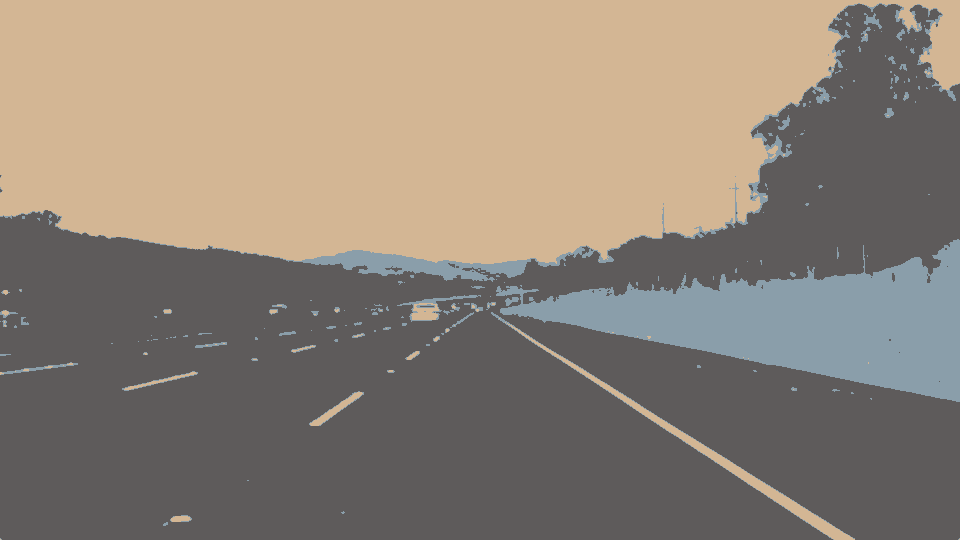

In [ ]:
# convert all pixels to the color of the centroids
segmented_image = centers[labels.flatten()]

# reshape back to the original image dimension
segmented_image = segmented_image.reshape(img_colored.shape)

cv2_imshow(segmented_image)

Image 2

In [ ]:
def convert_RGB2GRAY(img_RGB):
    return cv2.cvtColor(img_RGB, cv2.COLOR_RGB2GRAY)

def canny_edge_detector(image):
    # Canny edge detector with minVal of 50 and maxVal of 150
    canny = cv2.Canny(image, 50, 150)
    canny = cv2.dilate(canny, None)

    return canny

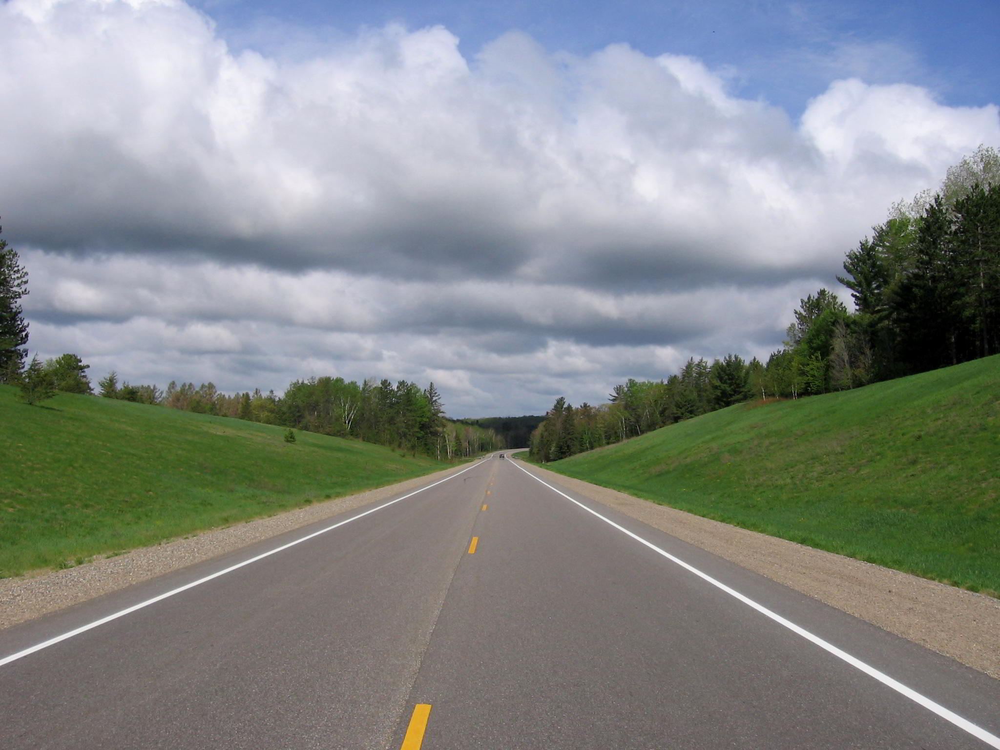

In [ ]:
img2 = cv2.imread('image-2.jpeg')
cv2_imshow(img2)

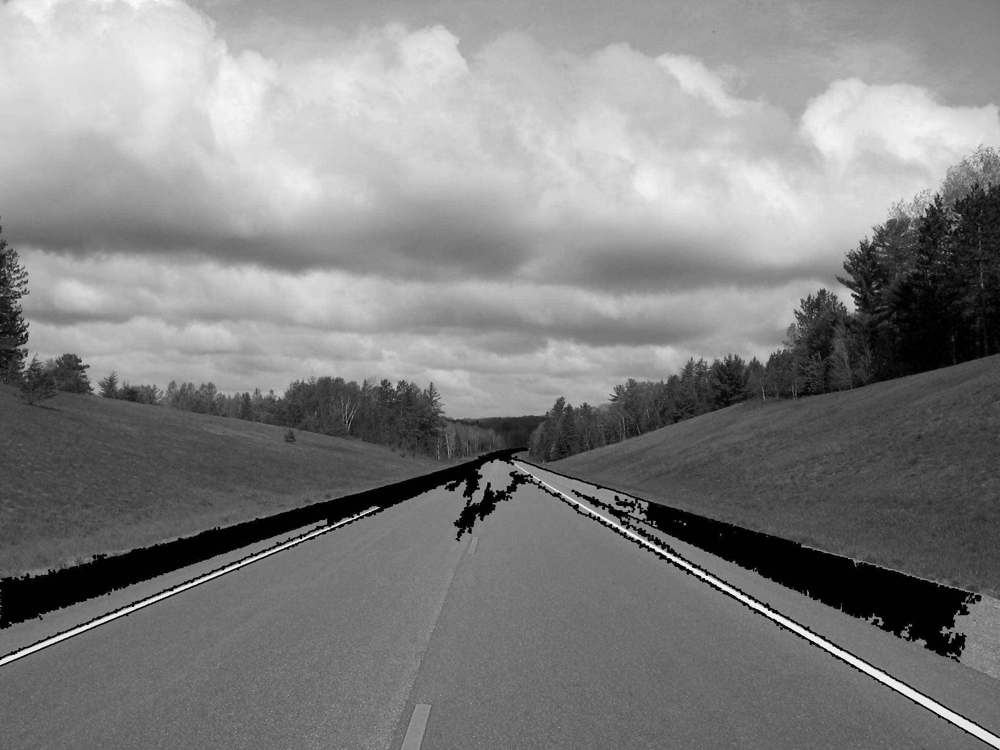

In [ ]:
img2_gray = convert_RGB2GRAY(img2)
cv2_imshow(img2_gray)

In [ ]:
ret, thresh = cv2.threshold(img2_gray, 150, 220, cv2.THRESH_BINARY)
#contours, hierarchy = cv2.findContours(image=thresh, mode=cv2.RETR_TREE, method=cv2.CHAIN_APPROX_NONE)
contours, hierarchy = cv2.findContours(thresh, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
# draw contours on the original image
image_copy = img2.copy()
#cv2.drawContours(image=image_copy, contours=contours, contourIdx=-1, color=(0, 255, 0), thickness=2,
 #                lineType=cv2.LINE_AA)
cnt = contours[4]
cv2.drawContours(image_copy, [cnt], 0, (0,255,0), 3)
# see the results
cv2_imshow(image_copy)

Image 3 Using edge detection



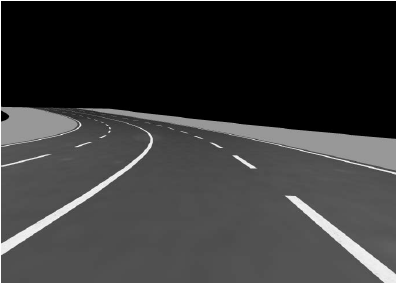

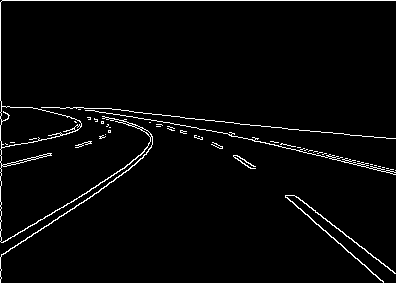

In [ ]:
img3 = cv2.imread('image-3.png')
edges = cv2.Canny(img3,100,200)

cv2_imshow(img3)
cv2_imshow(edges)

##Color-based Thresholding on image 1

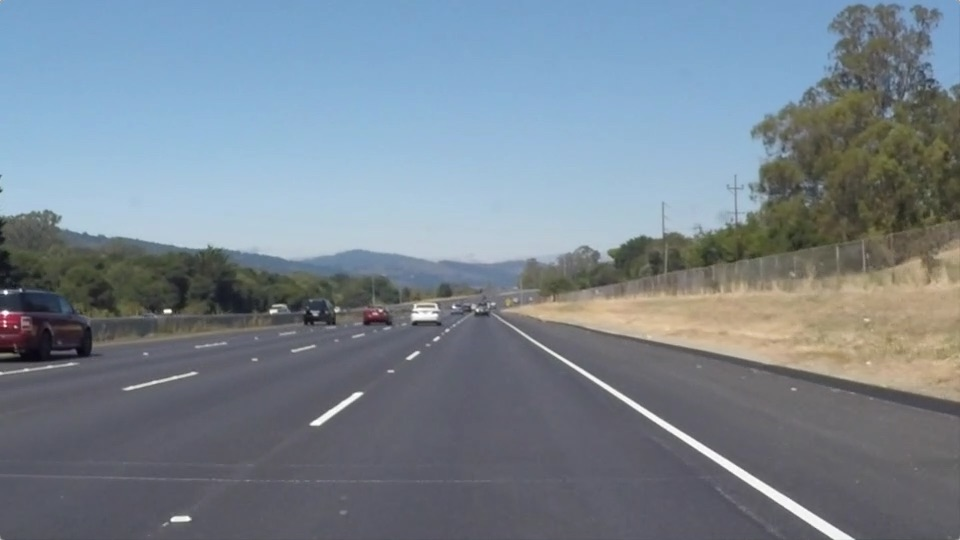

In [4]:
img1 = cv2.imread('image-1.jpeg')
blur = cv2.GaussianBlur(img1,(5,5),0)
hsv_img1 = cv2.cvtColor(blur, cv2.COLOR_RGB2HSV)
cv2_imshow(img1)

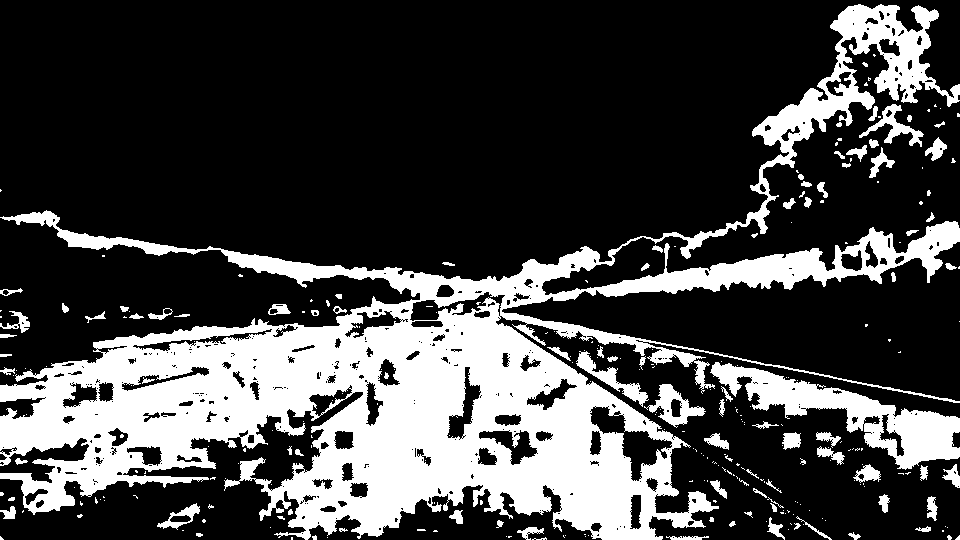

In [5]:
light_gray = (0, 0, 100)
dark_gray = (150,150,150)
mask = cv2.inRange(hsv_img1, light_gray, dark_gray)
cv2_imshow(mask)

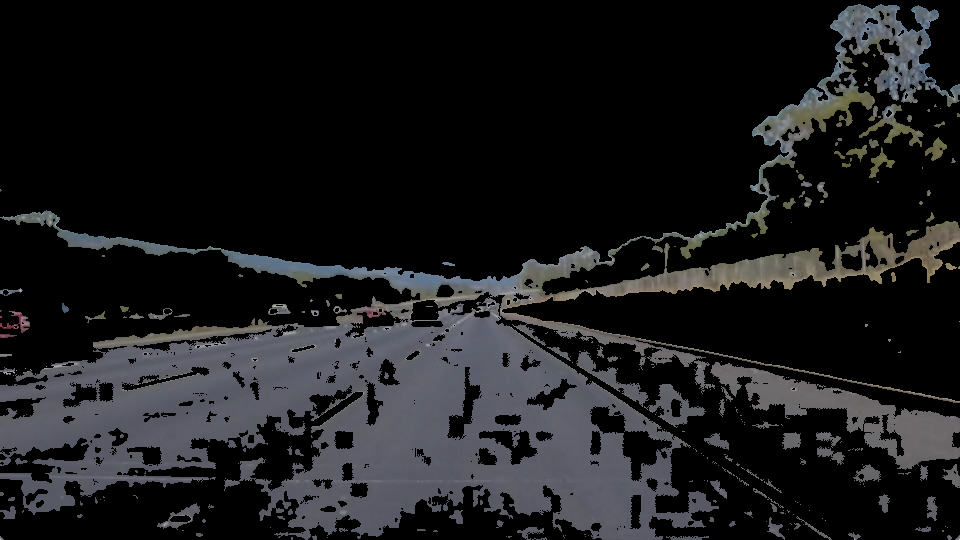

In [6]:
result = cv2.bitwise_and(img1, img1, mask=mask)
cv2_imshow(result)

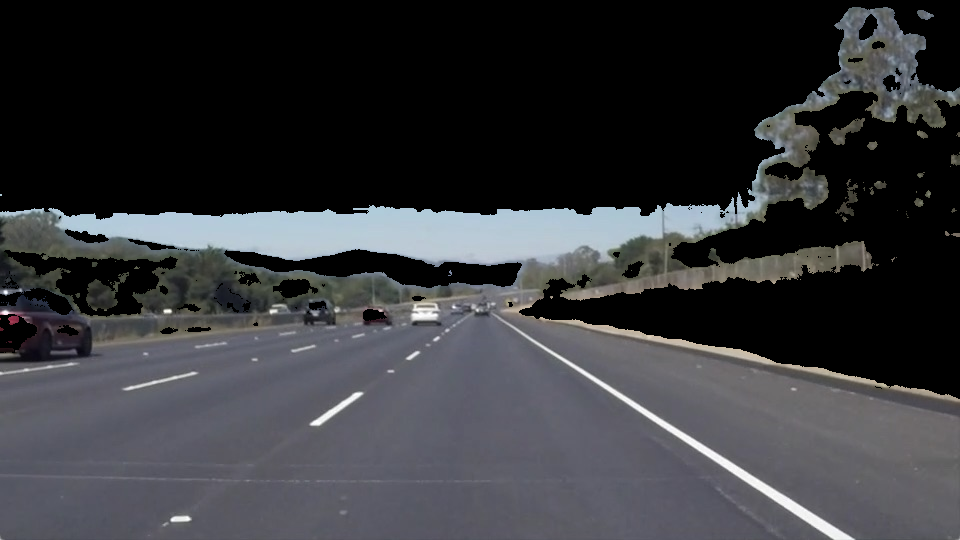

In [7]:
light_blue = (10,50,40)
dark_blue = (130,155,255)
mask = cv2.inRange(hsv_img1, light_blue, dark_blue)
inverted_mask = 255 - mask
result = cv2.bitwise_and(img1, img1, mask=inverted_mask)
cv2_imshow( result)

##Image 2 K-means

In [11]:
img2 = cv2.imread('image-2.jpeg')

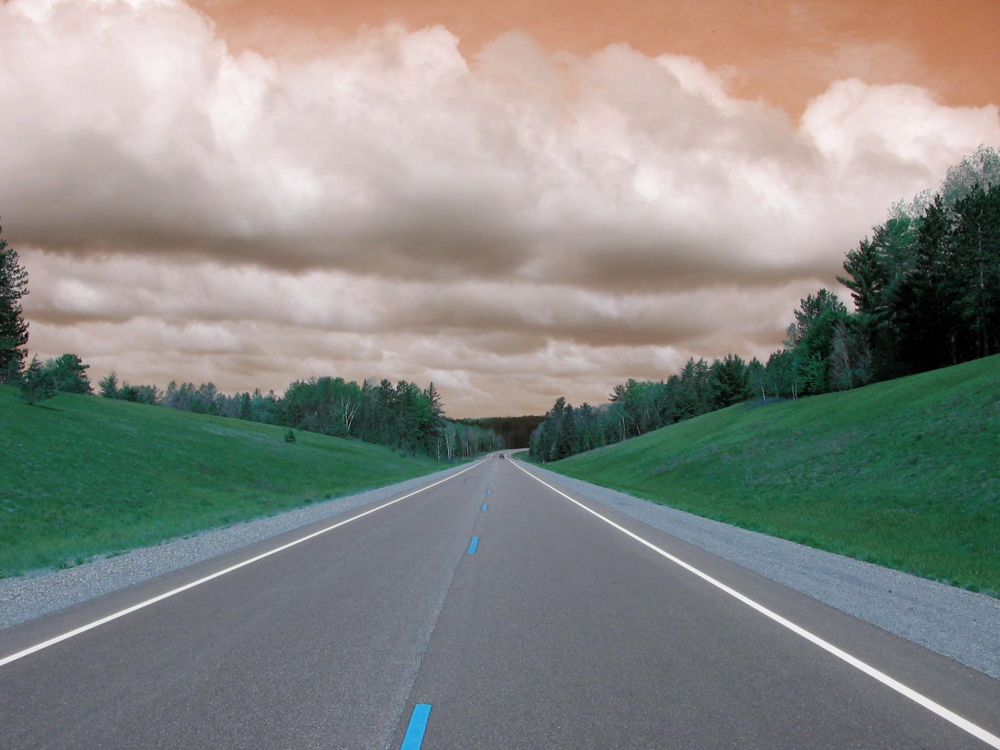

In [12]:
img2_colored = convert_BGR2RGB(img2)

cv2_imshow(img2_colored)

In [13]:
pixel_values_img2 = img2_colored.reshape((-1, 3))
# convert to float
pixel_values_img2 = np.float32(pixel_values_img2)
print(pixel_values_img2.shape)

(3145728, 3)


In [14]:
# define stopping criteria
criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 100, 1.0)
# number of clusters (K)
k = 3
_, labels, (centers) = cv2.kmeans(pixel_values_img2, k, None, criteria, 100, cv2.KMEANS_RANDOM_CENTERS)
centers = np.uint8(centers)
# flatten the labels array
labels = labels.flatten()

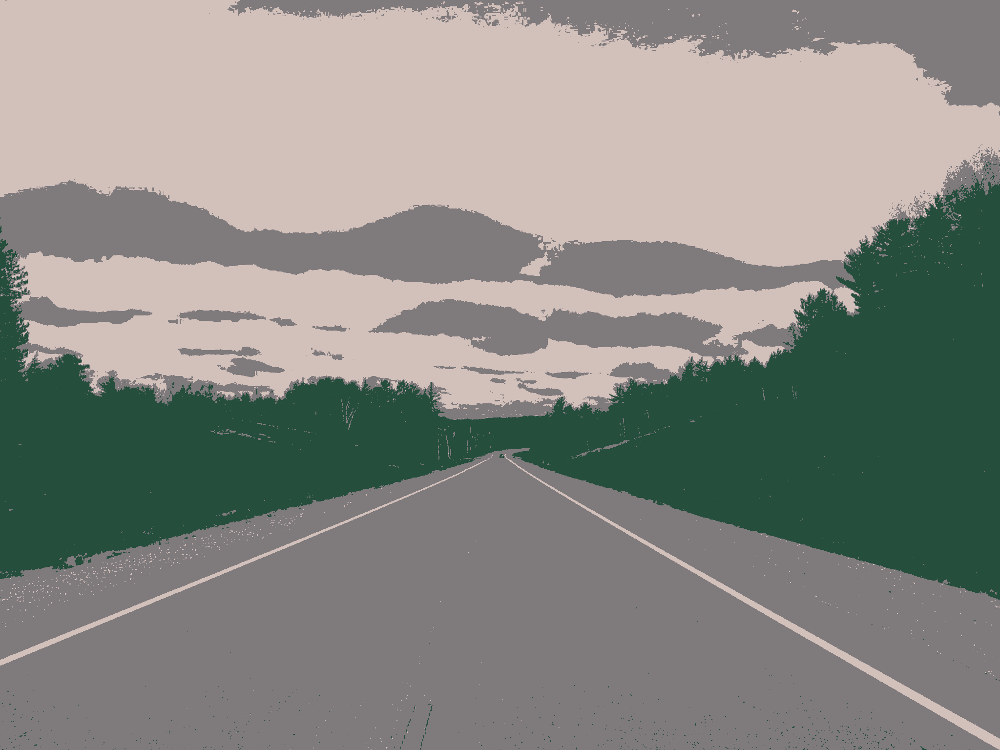

In [15]:
# convert all pixels to the color of the centroids
segmented_image2 = centers[labels.flatten()]

# reshape back to the original image dimension
segmented_image2 = segmented_image2.reshape(img2_colored.shape)

cv2_imshow(segmented_image2)

##Lane Detection Task

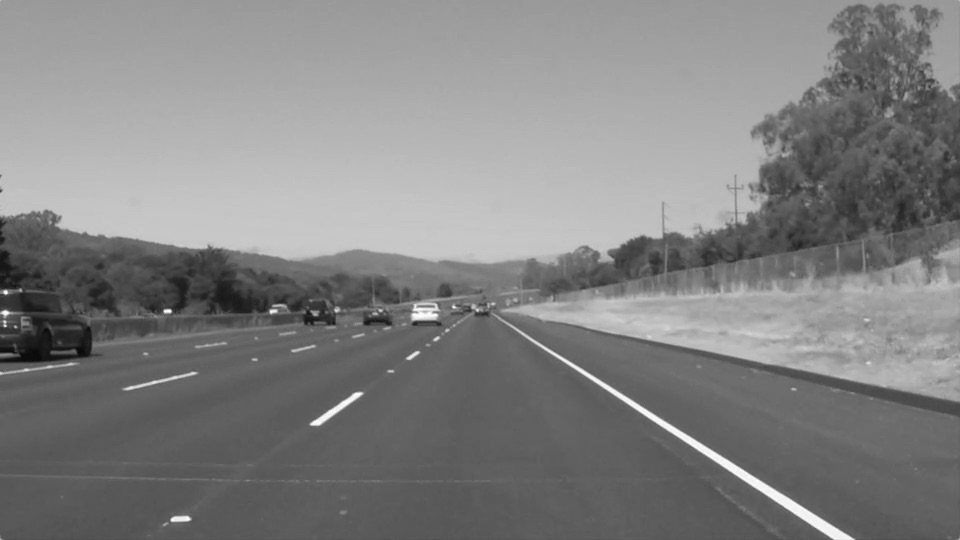

In [16]:
image = cv2.imread('image-1.jpeg')
gray = cv2.cvtColor(image,cv2.COLOR_BGR2GRAY)
cv2_imshow(gray)

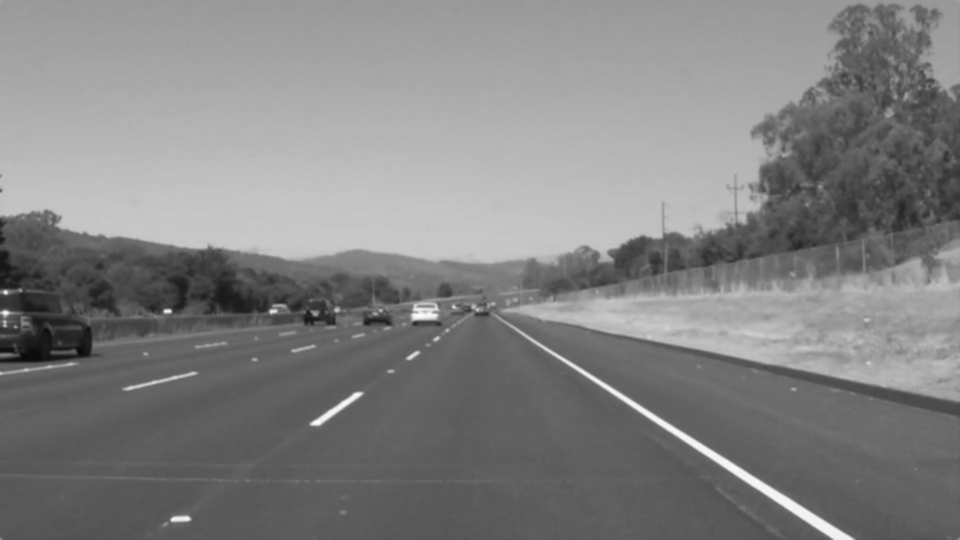

In [18]:
##Remove noise using Gaussian blur
blur = cv2.GaussianBlur(gray,(3,3),0)
cv2_imshow(blur)

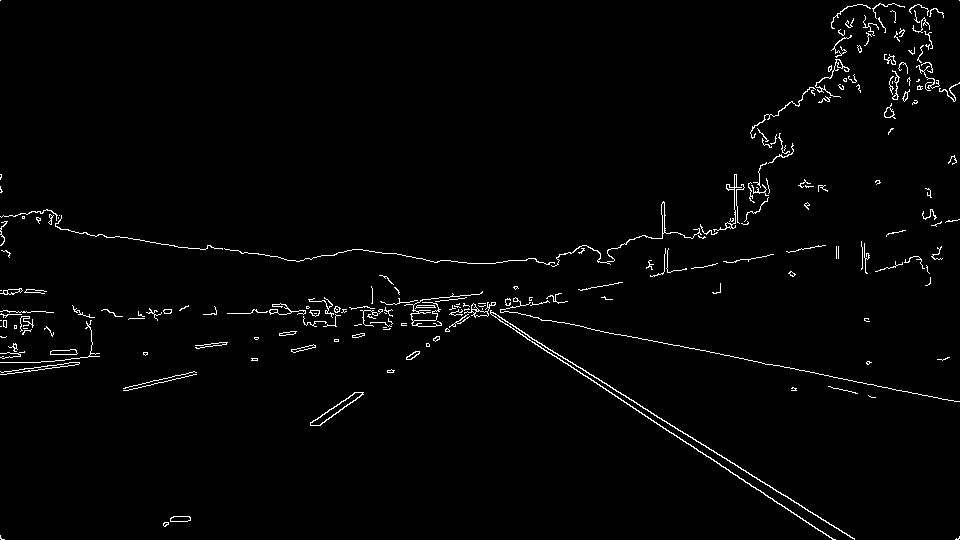

In [19]:
## Using Canny for edge detection
edges = cv2.Canny(image, 100,200)
cv2_imshow(edges)

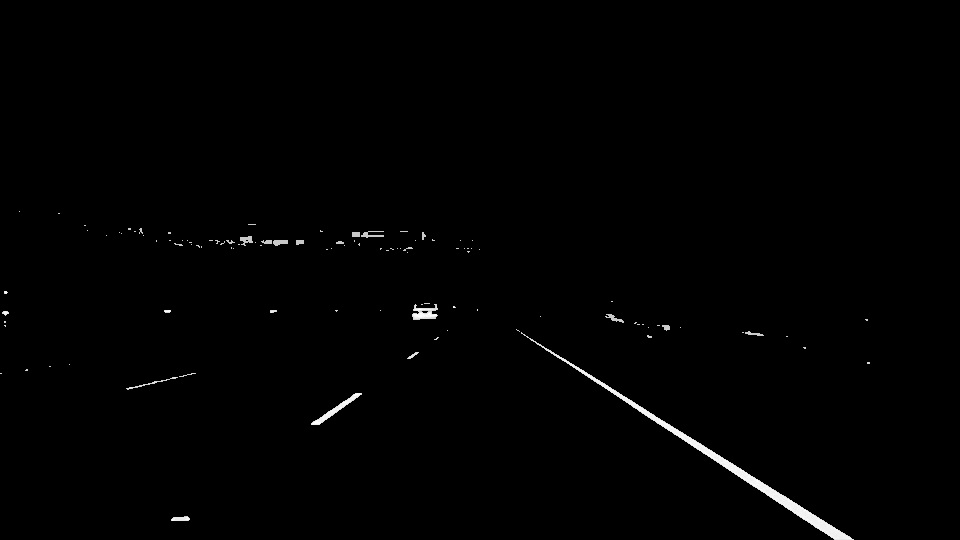

In [22]:
## Lane lines are always yellow and white
## Convert to HSV
img_hsv = cv2.cvtColor(image,cv2.COLOR_RGB2HSV)
lo_yellow = np.array([20,100,100], dtype = "uint8")
hi_yellow = np.array([30,255,255], dtype = "uint8")

mask_yellow = cv2.inRange(img_hsv, lo_yellow, hi_yellow)
mask_white = cv2.inRange(gray, 200,255)
mask_yellow_white = cv2.bitwise_or(mask_white, mask_yellow)
mask = cv2.bitwise_and(gray, mask_yellow_white)

cv2_imshow(mask)

In [52]:
## Detect Region of Interest (ROI)
def region(image):
    height, width = image.shape
    triangle = np.array([
                       [(100, height), (width//2, height//2), (width, height)]
                       ])
    
    mask = np.zeros_like(image)
    
    mask = cv2.fillPoly(mask, triangle, 255)
    mask = cv2.bitwise_and(image, mask)
    return mask

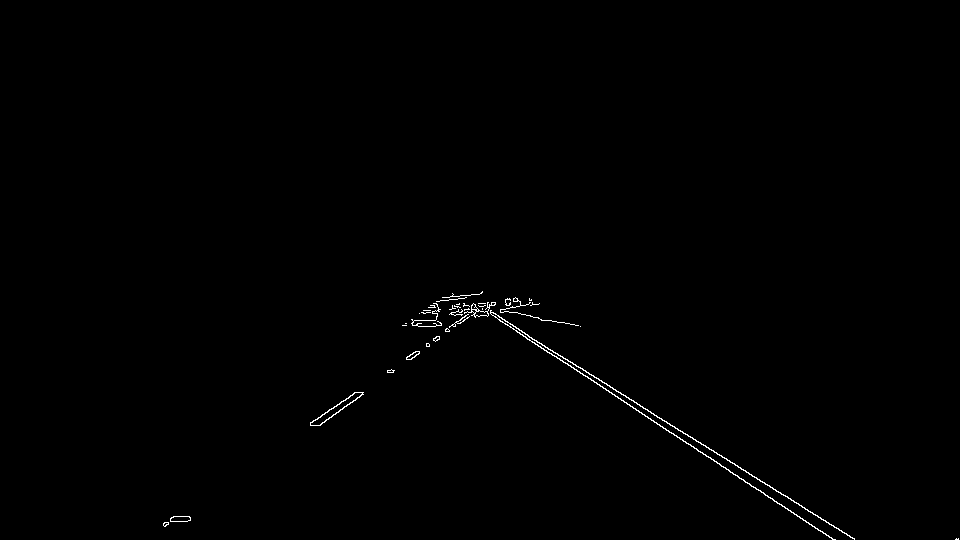

In [53]:
cropped_image = region(edges)
cv2_imshow(cropped_image)

In [54]:
## Hough line transform
lines = cv2.HoughLinesP(cropped_image, rho=2, theta=np.pi/180, threshold=100, minLineLength=40, maxLineGap=5)

In [55]:
def make_points(image, average): 
  slope, y_int = average 
  y1 = image.shape[0]
  y2 = int(y1 * (3/5))
  x1 = int((y1 - y_int) // slope)
  x2 = int((y2 - y_int) // slope)
  return np.array([x1, y1, x2, y2])

In [56]:
def average(image, lines):
  """
This function averages out the lines made in the cv2.HoughLinesP function. 
  """

  left = []
  right = []
  if lines is not None:
    for line in lines:
      #print(line)
      x1, y1, x2, y2 = line.reshape(4)
      #fit line to points, return slope and y-int
      parameters = np.polyfit((x1, x2), (y1, y2), 1)
      #print(parameters)
      slope = parameters[0]
      y_int = parameters[1]
      #lines on the right have positive slope, and lines on the left have neg slope
      if slope < 0:
          left.append((slope, y_int))
      else:
          right.append((slope, y_int))
            
    #takes average among all the columns (column0: slope, column1: y_int)
    right_avg = np.average(right, axis=0)
    left_avg = np.average(left, axis=0)
    #create lines based on averages calculates
    left_line = make_points(image, left_avg)
    right_line = make_points(image, right_avg)
    return np.array([left_line, right_line])  

In [57]:
def display_lines(image, lines):
  lines_image = np.zeros_like(image)
  if lines is not None:
    for line in lines:
      x1, y1, x2, y2 = line
      cv2.line(lines_image, (x1, y1), (x2, y2), (255, 0, 0), 10)
  return lines_image

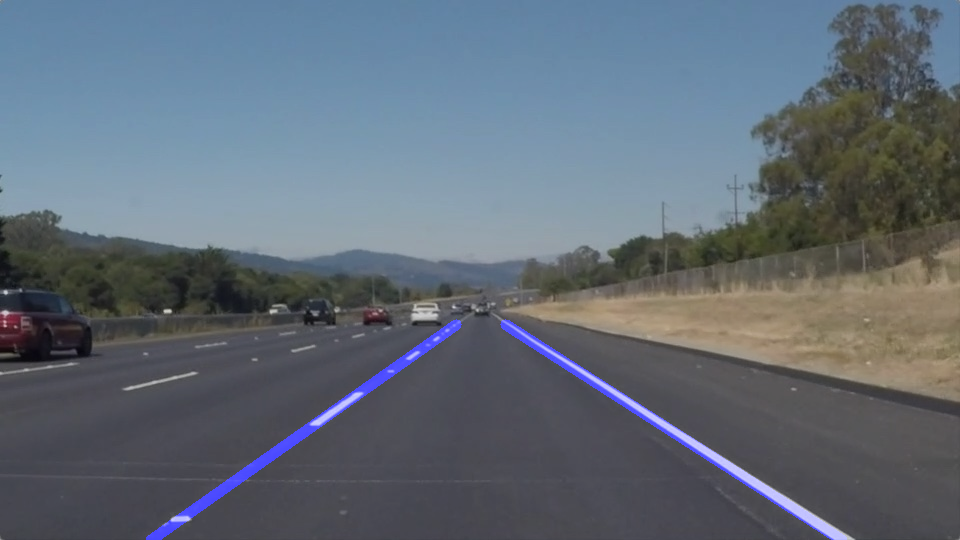

In [58]:
copy = np.copy(image)
averaged_lines = average(copy, lines)
black_lines = display_lines(copy, averaged_lines)
lanes = cv2.addWeighted(copy, 0.8, black_lines, 1, 1)
cv2_imshow(lanes)

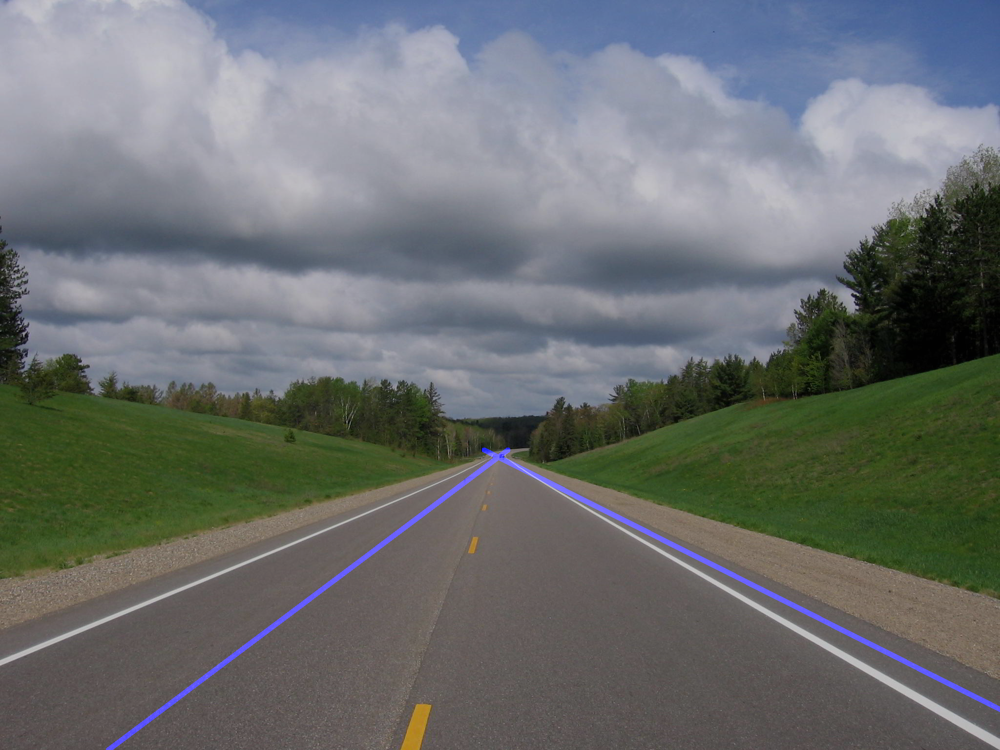

In [65]:
image2 = cv2.imread('image-2.jpeg')
gray2 = cv2.cvtColor(image2,cv2.COLOR_BGR2GRAY)
blur2 = cv2.GaussianBlur(gray2,(3,3),0)
edges2 = cv2.Canny(image2, 100,200)
## Lane lines are always yellow and white
## Convert to HSV
img_hsv = cv2.cvtColor(image2,cv2.COLOR_RGB2HSV)
lo_yellow = np.array([20,100,100], dtype = "uint8")
hi_yellow = np.array([30,255,255], dtype = "uint8")

mask_yellow = cv2.inRange(img_hsv, lo_yellow, hi_yellow)
mask_white = cv2.inRange(gray2, 200,255)
mask_yellow_white = cv2.bitwise_or(mask_white, mask_yellow)
mask = cv2.bitwise_and(gray2, mask_yellow_white)

cropped_image2 = region(edges2)
lines2 = cv2.HoughLinesP(cropped_image2, rho=2, theta=np.pi/180, threshold=100, minLineLength=40, maxLineGap=5)

averaged_lines2 = average(image2, lines2)
black_lines2 = display_lines(image2, averaged_lines2)
lanes2 = cv2.addWeighted(image2, 0.8, black_lines2, 1, 1)
cv2_imshow(lanes2)

In [77]:
from numpy.lib.function_base import delete
def lanesDetection(img):

    # print(img.shape)
    height= img.shape[0]
    width = img.shape[1]

    region_of_interest_vertices = [
        (200, height), (width//2, height//2), (width-300, height)
    ]
    gray_img = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    edge = cv2.Canny(gray_img, 50, 100, apertureSize=3)
    cropped_image = region_of_interest(
        edge, np.array([region_of_interest_vertices]))

    lines = cv2.HoughLinesP(cropped_image, rho=2, theta=np.pi/180,
                           threshold=50, lines=np.array([]), minLineLength=10, maxLineGap=5)
    image_with_lines = draw_lines(img, lines)
    # plt.imshow(image_with_lines)
    # plt.show()
    return image_with_lines

def region_of_interest(img, vertices):
    mask = np.zeros_like(img)
    # channel_count = img.shape[2]
    match_mask_color = (255)
    cv2.fillPoly(mask, vertices, match_mask_color)
    masked_image = cv2.bitwise_and(img, mask)
    return masked_image

def draw_lines(img, lines):
  img = np.copy(img)
  blank_image = np.zeros((img.shape[0], img.shape[1], 3), np.uint8)

  for line in lines:
    for x1, y1, x2, y2 in line:
      cv2.line(blank_image, (x1, y1), (x2, y2), (0, 255, 0), 2)

  img = cv2.addWeighted(img, 0.8, blank_image, 1, 0.0)
  return img

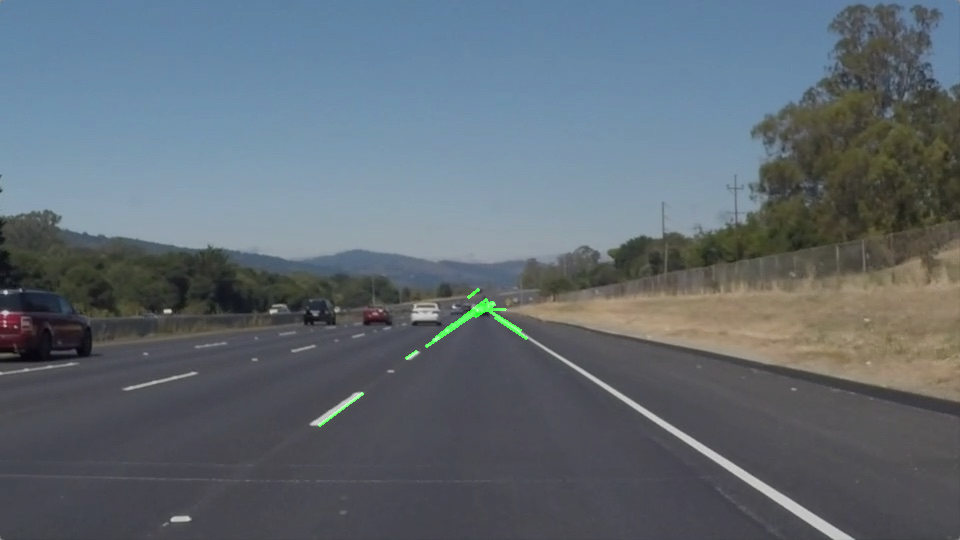

In [78]:
image1 = cv2.imread('image-1.jpeg')
lane1 = lanesDetection(image1)
cv2_imshow(lane1)

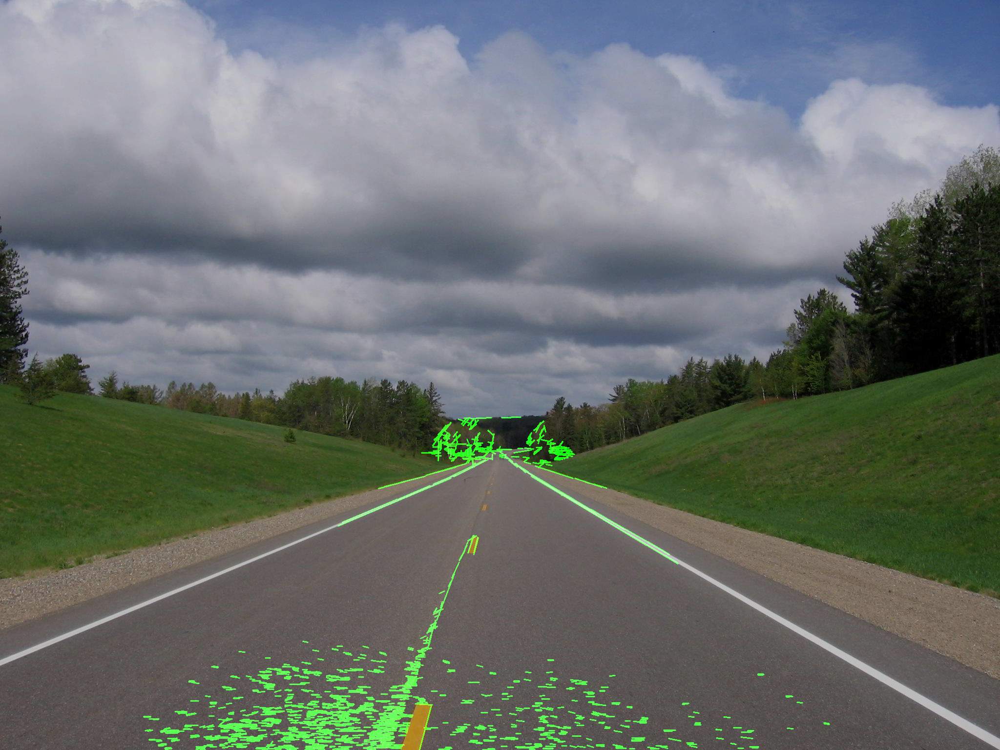

In [79]:
image2 = cv2.imread('image-2.jpeg')
lane2 = lanesDetection(image2)
cv2_imshow(lane2)